In [1]:
import pandas as pd
import numpy as np
import warnings 
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('credit card - credit card.csv')

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.shape

(30000, 25)

In [5]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [6]:
df.nunique() # get to know unique value

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [8]:
df = df.rename(columns={'default.payment.next.month':'payment'})

In [9]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [10]:
x = df.drop(['ID', 'payment'], axis = 1)

In [11]:
y = df[['payment']]

In [12]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [13]:
y.head()

,payment
0,1
1,1
2,0
3,0
4,0


In [14]:
y.value_counts() # 0 = won't pay on the other hand 1 means will need to pay

payment
0          23364
1           6636
Name: count, dtype: int64

In [15]:
23364/(23364 + 6636) 

0.7788

In [16]:
# 77% won't pay which is imbalance dataset

# Wrapper Method - Recusive Feature Elimination(FRE) in Python

In [17]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [18]:
# create a instance of the classifier
clf = LogisticRegression()

In [19]:
rfe  =RFE(estimator=clf, n_features_to_select=10)

In [20]:
#rfe

# Fit RFE to your Data

In [21]:
rfe.fit(x, y)

RFE(estimator=LogisticRegression(), n_features_to_select=10)

In [22]:
# print the selected feature 
selected_feature = rfe.support_
feature_ranks = rfe.ranking_

In [23]:
feature_ranks

array([ 8,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  9, 14, 11, 12,  7, 13,
        2,  3,  6,  4,  5, 10])

In [24]:
# print the feature and their ranks

for feature, ranks in zip(x.columns, feature_ranks):
    print(f'Feature: {feature}, Ranks: {ranks}')

Feature: LIMIT_BAL, Ranks: 8
Feature: SEX, Ranks: 1
Feature: EDUCATION, Ranks: 1
Feature: MARRIAGE, Ranks: 1
Feature: AGE, Ranks: 1
Feature: PAY_0, Ranks: 1
Feature: PAY_2, Ranks: 1
Feature: PAY_3, Ranks: 1
Feature: PAY_4, Ranks: 1
Feature: PAY_5, Ranks: 1
Feature: PAY_6, Ranks: 1
Feature: BILL_AMT1, Ranks: 9
Feature: BILL_AMT2, Ranks: 14
Feature: BILL_AMT3, Ranks: 11
Feature: BILL_AMT4, Ranks: 12
Feature: BILL_AMT5, Ranks: 7
Feature: BILL_AMT6, Ranks: 13
Feature: PAY_AMT1, Ranks: 2
Feature: PAY_AMT2, Ranks: 3
Feature: PAY_AMT3, Ranks: 6
Feature: PAY_AMT4, Ranks: 4
Feature: PAY_AMT5, Ranks: 5
Feature: PAY_AMT6, Ranks: 10


In [25]:
rfe.score(x, y)

0.8099333333333333

# Embadded Method - L1 regularization(Lasso)

In [26]:
# create an instance of the classifier with L1 regularization(Lasso)

clf_1 = LogisticRegression(penalty='l1', solver='liblinear')

In [27]:
clf_1.fit(x, y)

LogisticRegression(penalty='l1', solver='liblinear')

In [28]:
clfs_1 = clf_1.coef_

In [29]:
clfs_1

array([[-7.66686688e-07, -1.10325384e-01, -1.02031410e-01,
        -1.56985697e-01,  7.22841275e-03,  5.77138318e-01,
         8.26881320e-02,  7.20871927e-02,  2.38558042e-02,
         3.39543811e-02,  8.00416698e-03, -5.45172383e-06,
         2.28306895e-06,  1.40583670e-06, -1.92745655e-07,
         6.19193722e-07,  3.96068931e-07, -1.36025532e-05,
        -9.66021620e-06, -2.73769780e-06, -4.03298570e-06,
        -3.31353353e-06, -2.06581298e-06]])

In [30]:
for feature, cof in zip(x.columns, clfs_1[0]):
    print(f'Feature: {feature}, Coefficiwnt: {cof}')

Feature: LIMIT_BAL, Coefficiwnt: -7.666866875726351e-07
Feature: SEX, Coefficiwnt: -0.11032538408452261
Feature: EDUCATION, Coefficiwnt: -0.10203140955695394
Feature: MARRIAGE, Coefficiwnt: -0.1569856966862777
Feature: AGE, Coefficiwnt: 0.00722841274639136
Feature: PAY_0, Coefficiwnt: 0.5771383183807715
Feature: PAY_2, Coefficiwnt: 0.08268813203863833
Feature: PAY_3, Coefficiwnt: 0.07208719272750409
Feature: PAY_4, Coefficiwnt: 0.023855804248867272
Feature: PAY_5, Coefficiwnt: 0.033954381058195406
Feature: PAY_6, Coefficiwnt: 0.008004166980244526
Feature: BILL_AMT1, Coefficiwnt: -5.45172383221803e-06
Feature: BILL_AMT2, Coefficiwnt: 2.2830689451513107e-06
Feature: BILL_AMT3, Coefficiwnt: 1.405836699001824e-06
Feature: BILL_AMT4, Coefficiwnt: -1.9274565528354708e-07
Feature: BILL_AMT5, Coefficiwnt: 6.191937219783408e-07
Feature: BILL_AMT6, Coefficiwnt: 3.960689311359565e-07
Feature: PAY_AMT1, Coefficiwnt: -1.3602553217031214e-05
Feature: PAY_AMT2, Coefficiwnt: -9.660216203729665e-06
Fea

In [31]:
clf_1.score(x, y)

0.8111

# Filter Method - Extra Trees Classfier 

In [32]:
from sklearn.ensemble import ExtraTreesClassifier # decission tree

In [33]:
extr = ExtraTreesClassifier()

In [34]:
extr.fit(x, y)

ExtraTreesClassifier()

In [35]:
feature_imprt = extr.feature_importances_ # IG from decission tree

In [36]:
feature_imprt

array([0.06509351, 0.01088814, 0.03258408, 0.02185217, 0.06680392,
       0.1013026 , 0.04598786, 0.03399377, 0.03105635, 0.0297736 ,
       0.02641055, 0.0505111 , 0.04708661, 0.04537244, 0.04477001,
       0.04394257, 0.04415592, 0.04373019, 0.04236426, 0.04184597,
       0.0409535 , 0.04305136, 0.04646949])

In [37]:
imp = pd.DataFrame(feature_imprt, columns=['Gain_Score'])

In [38]:
imp

,Gain_Score
0,0.065094
1,0.010888
2,0.032584
3,0.021852
4,0.066804
5,0.101303
6,0.045988
7,0.033994
8,0.031056
9,0.029774


In [39]:
# feature name
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [40]:
cols = pd.DataFrame(x.columns, columns=['Feature_Name'])

In [41]:
cols

,Feature_Name
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [42]:
gains = pd.concat([cols, imp], axis=1)

In [43]:
gains

,Feature_Name,Gain_Score
0,LIMIT_BAL,0.065094
1,SEX,0.010888
2,EDUCATION,0.032584
3,MARRIAGE,0.021852
4,AGE,0.066804
5,PAY_0,0.101303
6,PAY_2,0.045988
7,PAY_3,0.033994
8,PAY_4,0.031056
9,PAY_5,0.029774


In [44]:
gains.nlargest(15, 'Gain_Score') # will show up 15 row with the largest value

,Feature_Name,Gain_Score
5,PAY_0,0.101303
4,AGE,0.066804
0,LIMIT_BAL,0.065094
11,BILL_AMT1,0.050511
12,BILL_AMT2,0.047087
22,PAY_AMT6,0.046469
6,PAY_2,0.045988
13,BILL_AMT3,0.045372
14,BILL_AMT4,0.044770
16,BILL_AMT6,0.044156


In [45]:
gains.nsmallest(8, 'Gain_Score') # will show up 15 row with the smallest value

,Feature_Name,Gain_Score
1,SEX,0.010888
3,MARRIAGE,0.021852
10,PAY_6,0.026411
9,PAY_5,0.029774
8,PAY_4,0.031056
2,EDUCATION,0.032584
7,PAY_3,0.033994
20,PAY_AMT4,0.040954


In [46]:
newx = gains.nlargest(18, 'Gain_Score') 

In [47]:
newx

,Feature_Name,Gain_Score
5,PAY_0,0.101303
4,AGE,0.066804
0,LIMIT_BAL,0.065094
11,BILL_AMT1,0.050511
12,BILL_AMT2,0.047087
22,PAY_AMT6,0.046469
6,PAY_2,0.045988
13,BILL_AMT3,0.045372
14,BILL_AMT4,0.044770
16,BILL_AMT6,0.044156


In [48]:
import matplotlib.pyplot as plt

<Axes: >

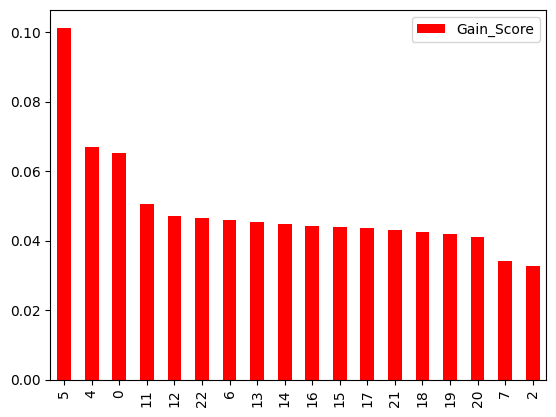

In [49]:
newx.plot(kind = 'bar', color=['red'])

<Axes: >

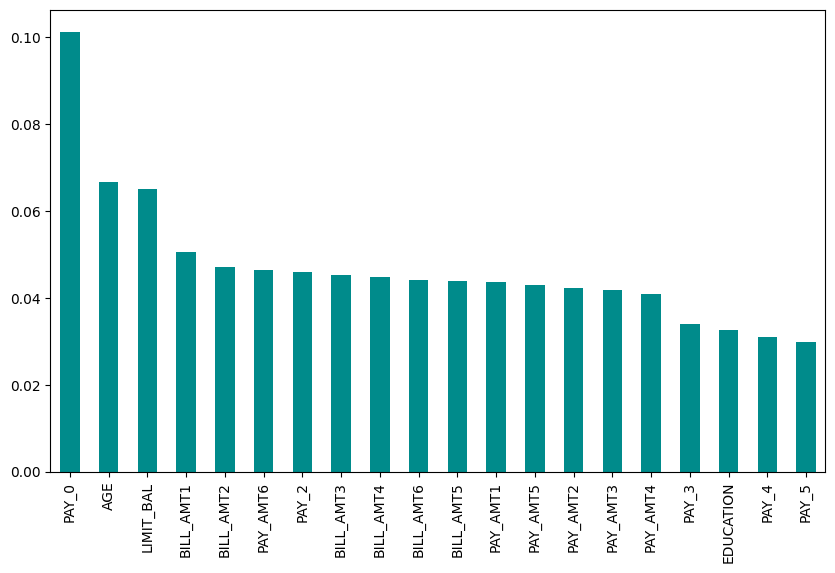

In [50]:
features = pd.Series(extr.feature_importances_, index=x.columns)
plt.figure(figsize=(10, 6))
features.nlargest(20).plot(kind='bar', color='DarkCyan')

In [51]:
x.corr() # [-1, 1]

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [52]:
x.describe()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,...,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,...,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,...,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


In [53]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [54]:
import seaborn as sns

In [55]:
feature_name = x.columns

<Axes: >

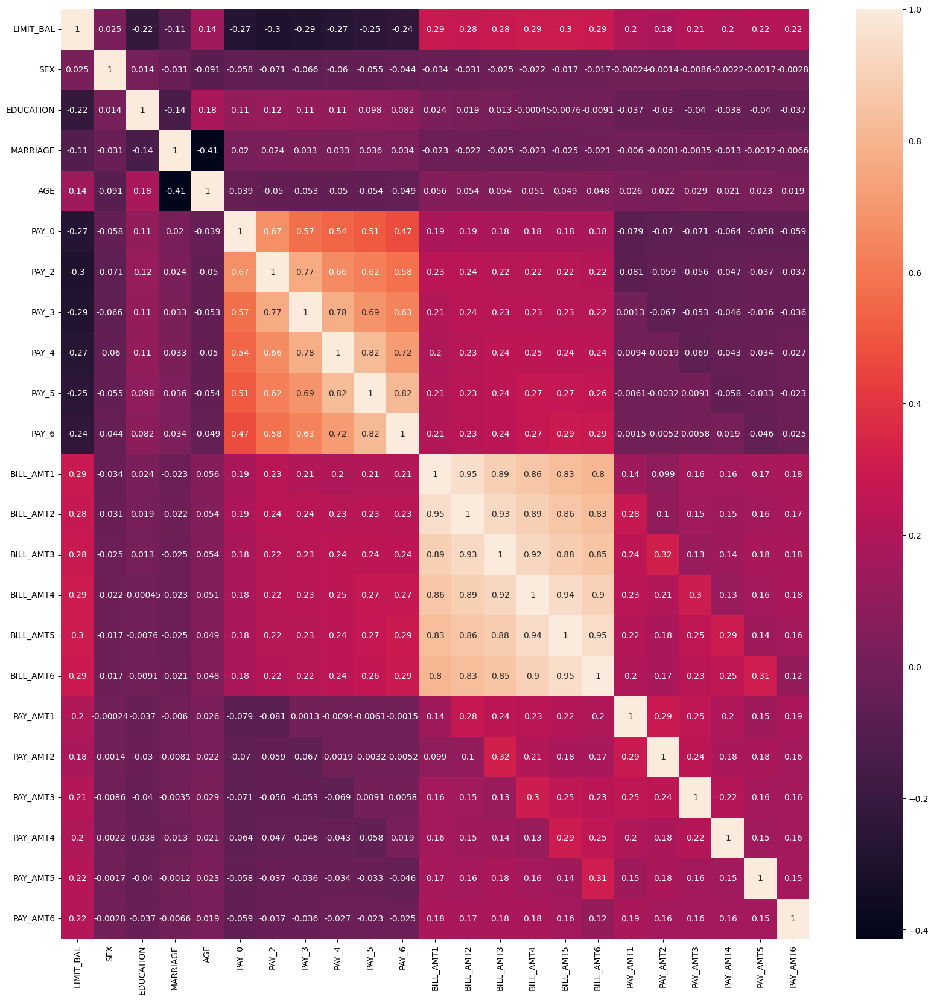

In [56]:
colname = x.corr().index
plt.figure(figsize=(20, 20))
sns.heatmap(df[colname].corr(), annot=True)

# Select K Best

In [57]:
df = pd.read_csv('credit card - credit card.csv')
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID', 'payment'], axis = 1)
y = df[['payment']]

In [58]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [59]:
from sklearn.feature_selection import SelectKBest, f_classif, chi2, f_regression # chi2 only when feature are non negative

In [60]:
model2 = SelectKBest(score_func=f_classif)

In [61]:
feature_score = model2.fit(x, y)

In [62]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [63]:
cols = pd.DataFrame(feature_score.scores_, columns=['Feature_Score'])

In [64]:
cols

,Feature_Score
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556
5,3537.714970
6,2239.169136
7,1757.466444
8,1476.845967
9,1304.591176


In [65]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [66]:
col2 = pd.DataFrame(x.columns, columns=['Feature_Name'])

In [67]:
col2

,Feature_Name
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE
5,PAY_0
6,PAY_2
7,PAY_3
8,PAY_4
9,PAY_5


In [68]:
scores = pd.concat([col2, cols], axis=1)

In [69]:
scores

,Feature_Name,Feature_Score
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [70]:
scores.nlargest(15, 'Feature_Score')

,Feature_Name,Feature_Score
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [71]:
scores.nsmallest(8, 'Feature_Score')

,Feature_Name,Feature_Score
16,BILL_AMT6,0.865820
15,BILL_AMT5,1.371087
14,BILL_AMT4,3.094745
4,AGE,5.788556
13,BILL_AMT3,5.944388
12,BILL_AMT2,6.044238
11,BILL_AMT1,11.580532
3,MARRIAGE,17.781271


In [72]:
# drop less important column

In [74]:
#df.to_csv('')

In [75]:
scores = pd.concat([col2, cols], axis=1)

In [76]:
new_x = scores.nlargest(15, 'Feature_Score')

In [77]:
new_x

,Feature_Name,Feature_Score
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


# PCA

In [78]:
import pandas as pd


In [79]:
df = pd.read_csv('credit card - credit card.csv')

In [80]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [81]:
df = df.rename(columns={'default.payment.next.month':'payment'})
x = df.drop(['ID', 'payment'], axis = 1)
y = df[['payment']]

In [82]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [83]:
# first priority is Scaling
from sklearn.preprocessing import MinMaxScaler

In [84]:
mnx = MinMaxScaler()

In [85]:
scaled_x = mnx.fit_transform(x)

In [86]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

In [87]:
scaled_x.shape

(30000, 23)

In [88]:
from sklearn.decomposition import PCA

In [89]:
pca = PCA(n_components=3)

In [90]:
x_pca = pca.fit_transform(scaled_x)

In [91]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259673],
       [-0.39188881,  0.209224  , -0.19698759],
       [-0.39264215,  0.08409527, -0.12656657],
       ...,
       [ 0.62351265,  0.33728836, -0.0848918 ],
       [ 0.60374479, -0.01953155,  0.21421103],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [92]:
features = pd.DataFrame(x_pca, columns = ['pca1', 'pca2', 'pca3'])

In [93]:
features

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [94]:
import plotly.express as pl

In [95]:
pl.scatter_3d(features, x = 'pca1', y = 'pca2', z = 'pca3', color = 'pca1')

In [98]:
from sklearn.model_selection import train_test_split as tts

In [101]:
xtrain, xtest, ytrain, ytest = tts(features, y,  test_size=0.30, random_state=1)

In [102]:
xtrain

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131
...,...,...,...
17289,-0.387321,0.169520,0.248251
5192,-0.413089,-0.415968,0.140726
12172,0.599752,0.071849,-0.267975
235,0.595272,-0.211586,-0.193925


In [103]:
xtrain.shape

(21000, 3)

In [104]:
from sklearn.linear_model import LogisticRegression

In [105]:
lg = LogisticRegression()

In [106]:
lg.fit(xtrain, ytrain)

LogisticRegression()

In [107]:
lg.score(xtrain, ytrain)

0.7938571428571428

In [108]:
lg.score(xtest, ytest)

0.7962222222222223

In [109]:
y.value_counts()

payment
0          23364
1           6636
Name: count, dtype: int64

In [110]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


# Before PCA

In [111]:
xtrain, xtest, ytrain, ytest = tts(x, y,  test_size=0.30, random_state=1)

In [112]:
lg.fit(x, y)

LogisticRegression()

In [113]:
lg.score(xtrain, ytrain)

0.7792857142857142

In [114]:
lg.score(xtest, ytest)

0.7777777777777778